In [92]:
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
base_info = pd.read_csv('./data/train/base_info.csv')
entprise_info = pd.read_csv('./data/train/entprise_info.csv')

In [93]:
import os

path = './feature_engineering/features/'
files = os.listdir(path)
files


['annual_report_info_feature.csv',
 'other_info_feature.csv',
 'news_info_feature.csv',
 'tax_info_feature.csv',
 'change_info_feature.csv',
 'base_info_feature.csv']

In [94]:
# features = pd.read_csv(f'{path}/base_info_feature.csv')
# for file in tqdm(files):
#     if file != 'base_info_feature.csv':
#         another_feature = pd.read_csv(f'{path}/{file}')
#         features = pd.merge(features, another_feature, on='id',how = 'left')

In [95]:

data = pd.merge(base_info,entprise_info,how='left',on='id')
data.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 24865 entries, 0 to 24864
Data columns (total 34 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             24865 non-null  object 
 1   oplocdistrict  24865 non-null  int64  
 2   industryphy    24865 non-null  object 
 3   industryco     24864 non-null  float64
 4   dom            24865 non-null  object 
 5   opscope        24865 non-null  object 
 6   enttype        24865 non-null  int64  
 7   enttypeitem    16651 non-null  float64
 8   opfrom         24865 non-null  object 
 9   opto           8825 non-null   object 
 10  state          24865 non-null  int64  
 11  orgid          24865 non-null  int64  
 12  jobid          24865 non-null  int64  
 13  adbusign       24865 non-null  int64  
 14  townsign       24865 non-null  int64  
 15  regtype        24865 non-null  int64  
 16  empnum         19615 non-null  float64
 17  compform       10631 non-null  float64
 18  parnum

In [96]:

train = data[data['label'] >= 0 ]
test =  data[data['label'].isnull() ]

In [97]:
# 14:1 标签
positive, nagivate = train[train['label'] == 0],train[train['label'] == 1]
print(positive.shape[0]/nagivate.shape[0])

14.15290519877676


In [98]:
nan_num = train.isnull().sum(axis=1)
col = 'addtion_nan_num'
train[col] = nan_num
print(train.columns)
train.sort_values(by = [col],ascending=True,ignore_index = True,inplace= True)

nan_num = test.isnull().sum(axis=1)
test[col] = nan_num
print(test.columns)
test.sort_values(by = [col],ascending=True,ignore_index = True,inplace= True)

Index(['id', 'oplocdistrict', 'industryphy', 'industryco', 'dom', 'opscope',
       'enttype', 'enttypeitem', 'opfrom', 'opto', 'state', 'orgid', 'jobid',
       'adbusign', 'townsign', 'regtype', 'empnum', 'compform', 'parnum',
       'exenum', 'opform', 'ptbusscope', 'venind', 'enttypeminu',
       'midpreindcode', 'protype', 'oploc', 'regcap', 'reccap', 'forreccap',
       'forregcap', 'congro', 'enttypegb', 'label', 'addtion_nan_num'],
      dtype='object')
Index(['id', 'oplocdistrict', 'industryphy', 'industryco', 'dom', 'opscope',
       'enttype', 'enttypeitem', 'opfrom', 'opto', 'state', 'orgid', 'jobid',
       'adbusign', 'townsign', 'regtype', 'empnum', 'compform', 'parnum',
       'exenum', 'opform', 'ptbusscope', 'venind', 'enttypeminu',
       'midpreindcode', 'protype', 'oploc', 'regcap', 'reccap', 'forreccap',
       'forregcap', 'congro', 'enttypegb', 'label', 'addtion_nan_num'],
      dtype='object')


In [99]:
def count(data):
    nums = []
    num = 0
    for id in data.index:
        if data.loc[id]['label'] == 1:
            num += 1
        nums.append(num)
    return nums

    

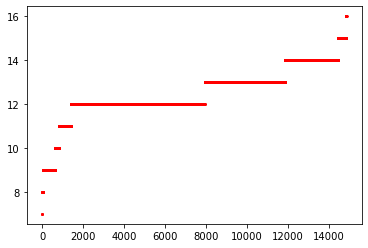

In [100]:
import numpy as np
plt.scatter(train.index,train[col],c = 'r',s=2)
plt.show()

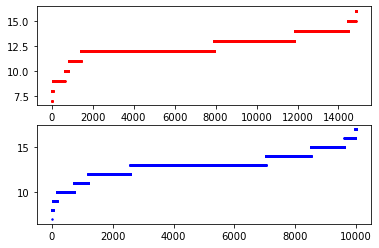

In [101]:
plt.subplot(211)  
plt.scatter(train.index,train[col],c = 'r',s=2)
plt.subplot(212)  
plt.scatter(test.index,test[col],c = 'b',s=2)
# plt.subplot(223)
# plt.plot(train.index,train.nan_num,c = 'r')
# plt.subplot(224)
# plt.plot(test.index,test.nan_num, c = 'b')

plt.show()

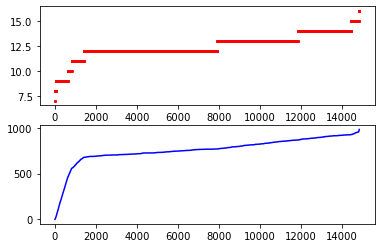

<Figure size 432x288 with 0 Axes>

In [102]:

plt.subplot(211) 
plt.scatter(train.index,train[col],c = 'r',s = 2)
plt.subplot(212) 
plt.plot(train.index,count(train), c = 'b')
plt.show()
plt.savefig('img.png')

In [103]:
train[col].value_counts().sort_index()

7        6
8       37
9      580
10     193
11     594
12    6522
13    3921
14    2603
15     378
16      31
Name: addtion_nan_num, dtype: int64

In [104]:
test[col].value_counts().sort_index()

7        1
8       36
9      129
10     564
11     466
12    1385
13    4444
14    1483
15    1107
16     351
17      34
Name: addtion_nan_num, dtype: int64

In [106]:
# 处理日期类
date_cols = ['opfrom','opto']
for col in tqdm(date_cols):
    train[f'{col}_year'] = pd.to_datetime(train[col]).dt.year.fillna(-1)
train['dt'] = train['opto_year'] -  train['opfrom_year']
train['dt'] = np.maximum(train['dt'].values,-1)
# train.drop(date_cols,axis=1,inplace=True)

date_cols = ['opfrom','opto']
for col in tqdm(date_cols):
    test[f'{col}_year'] = pd.to_datetime(test[col]).dt.year.fillna(-1)
test['dt'] = test['opto_year'] -  test['opfrom_year']
test['dt'] = np.maximum(test['dt'].values,-1)
# test.drop(date_cols,axis=1,inplace=True)



100%|██████████| 2/2 [00:00<00:00, 147.29it/s]


In [107]:
train.sort_values(by = ['dt'],ascending=True,ignore_index = True,inplace= True)
test.sort_values(by = ['dt'],ascending=True,ignore_index = True,inplace= True)

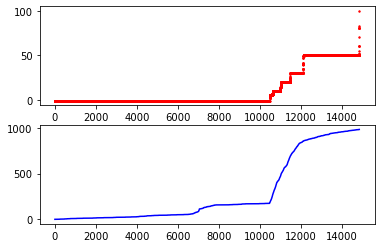

In [108]:
plt.subplot(211) 
plt.scatter(train.index,train['dt'],c = 'r',s = 2)
plt.subplot(212) 
plt.plot(train.index,count(train), c = 'b')
plt.show()

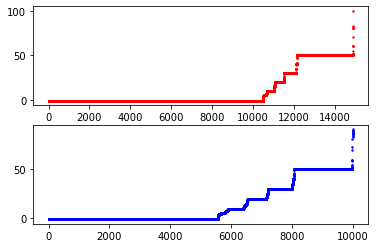

In [109]:
plt.subplot(211)  
plt.scatter(train.index,train['dt'],c = 'r',s=2)
plt.subplot(212)  
plt.scatter(test.index,test['dt'],c = 'b',s=2)
plt.show()

In [111]:
test['dt'].value_counts().sort_index()

-1.0     5559
 0.0        2
 1.0        5
 2.0        9
 3.0       15
         ... 
 85.0       1
 86.0       2
 87.0       3
 89.0       5
 91.0       1
Name: dt, Length: 66, dtype: int64